<a href="https://colab.research.google.com/github/google/auto-arborist/blob/main/data_visualization/AutoArboristDataColab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Visualizer for Auto Arborist

This CoLab provides a simple and interactive data loading and visualization interface for the Auto Arborist Dataset.

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib
import matplotlib.pyplot as plt


In [ ]:
# This defines the structure of the features in the TF Examples

features = {
      'tree/city':
          tf.io.FixedLenFeature((), tf.string),
      'tree/id':
          tf.io.FixedLenFeature((), tf.string),
      'tree/idx':
          tf.io.FixedLenFeature((), tf.string),
      'tree/genus/label':
          tf.io.FixedLenFeature((), tf.int64),
      'tree/genus/genus':
          tf.io.FixedLenFeature((), tf.string),
      'tree/latitude':
          tf.io.FixedLenFeature((), tf.float32),
      'tree/longitude':
          tf.io.FixedLenFeature((), tf.float32),
      'aerial/encoded': tf.io.FixedLenFeature((), tf.string),
      'streetlevel/encoded': tf.io.FixedLenFeature((), tf.string),
  }


--------------------------------------------------------------------
source_id: 16942296846213778981
38.013614654541016, -78.50100708007812: robinia (258)


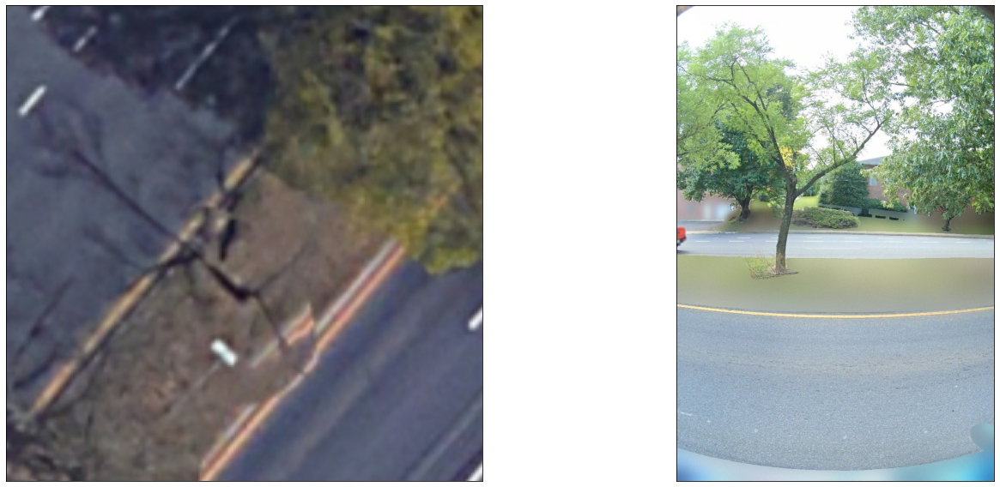

--------------------------------------------------------------------
source_id: 13599958640559067905
38.02657699584961, -78.49002838134766: prunus (235)


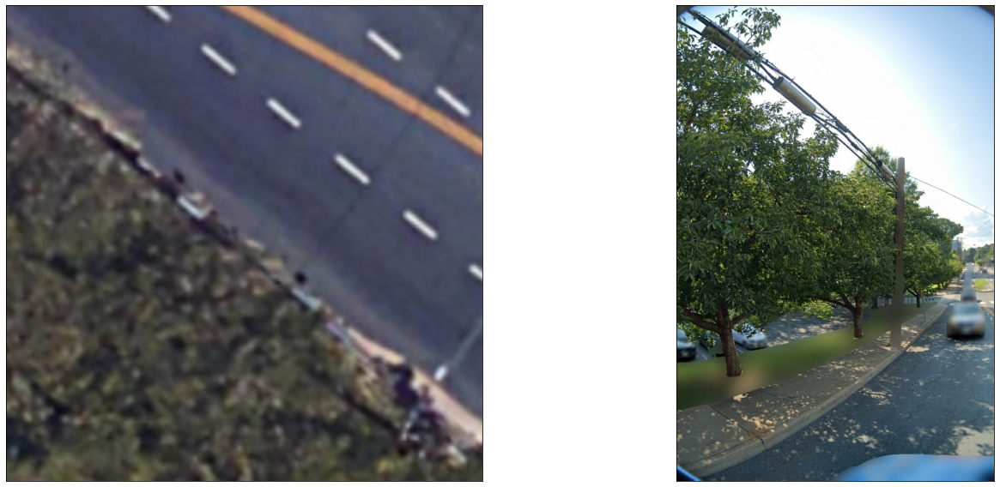

--------------------------------------------------------------------
source_id: 12802114834258519583
38.026309967041016, -78.51371002197266: crataegus (89)


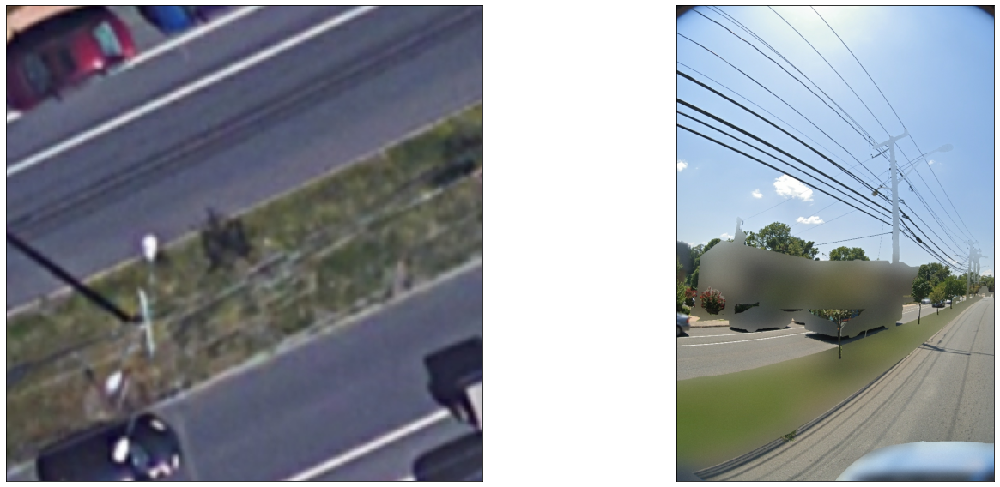

--------------------------------------------------------------------
source_id: 12712060690309937146
38.021209716796875, -78.5147933959961: syringa (291)


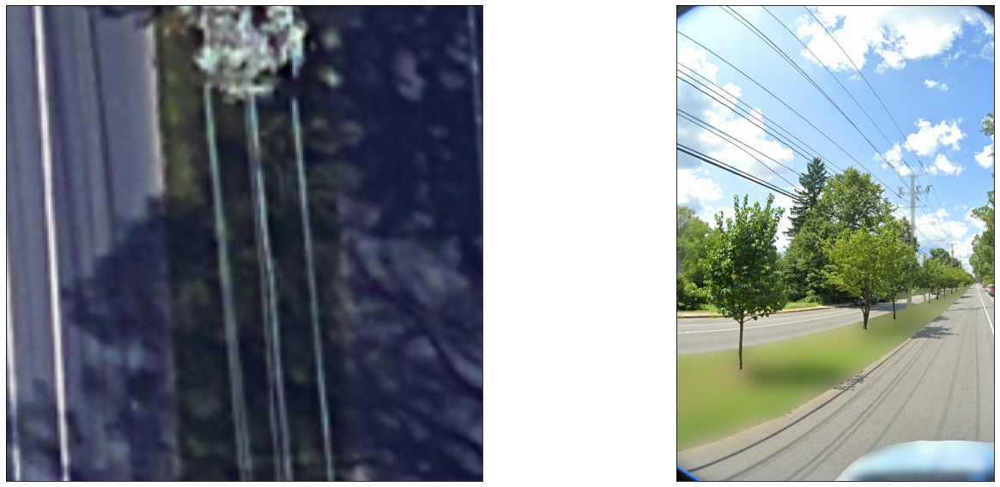

--------------------------------------------------------------------
source_id: 3582857269179366652
38.027565002441406, -78.48204040527344: quercus (247)


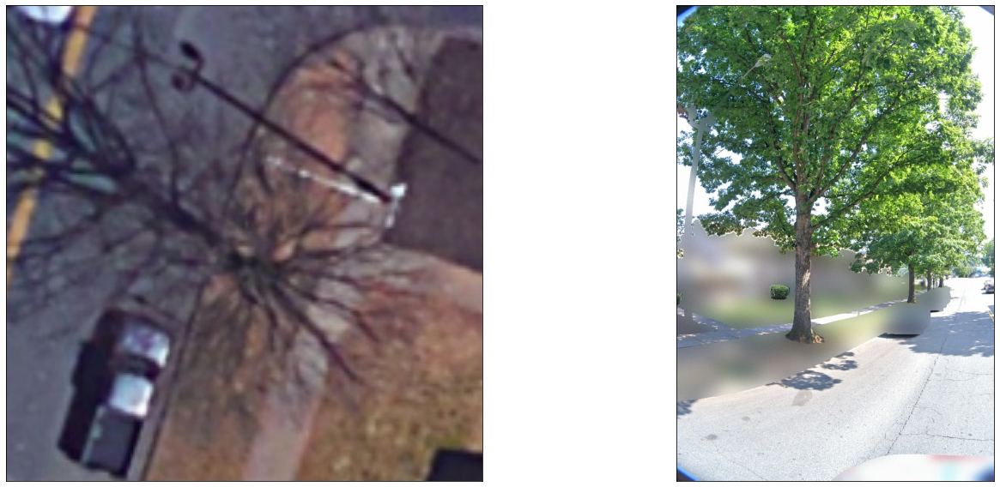

--------------------------------------------------------------------
source_id: 11700658938239178173
38.025718688964844, -78.48110961914062: ginkgo (131)


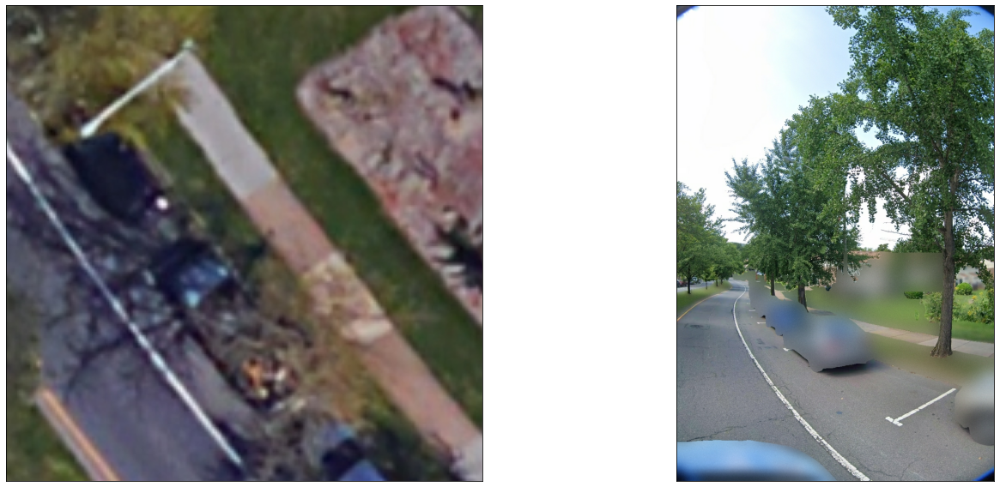

--------------------------------------------------------------------
source_id: 11057427689310699537
38.02725601196289, -78.47754669189453: lagerstroemia (160)


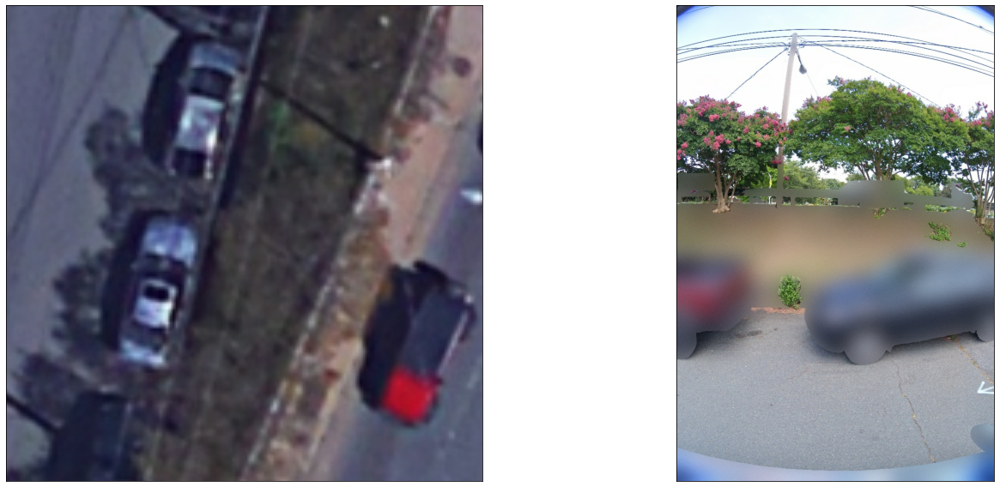

--------------------------------------------------------------------
source_id: 13454373666916938683
38.02429962158203, -78.47666931152344: chionanthus (73)


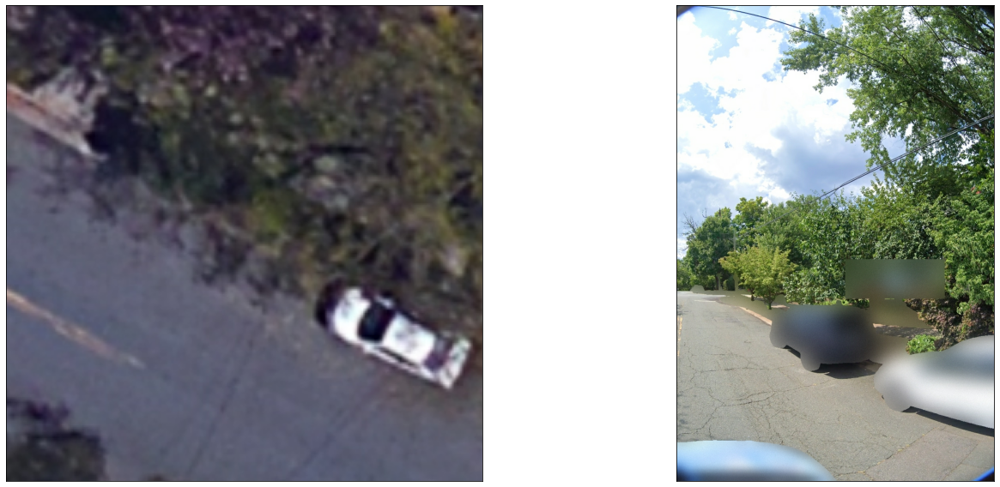

--------------------------------------------------------------------
source_id: 15722708743536200583
38.02417755126953, -78.47637939453125: prunus (235)


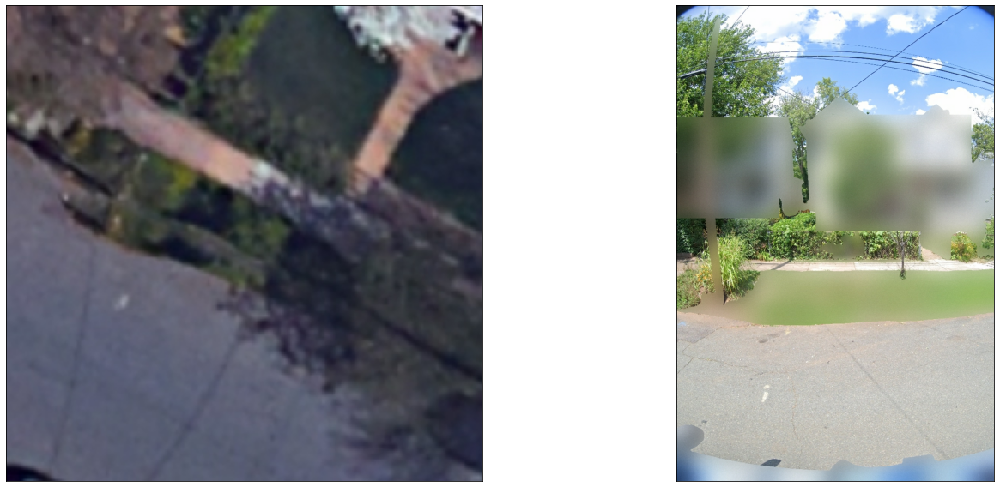

--------------------------------------------------------------------
source_id: 7836879993067337109
38.02164840698242, -78.51481628417969: syringa (291)


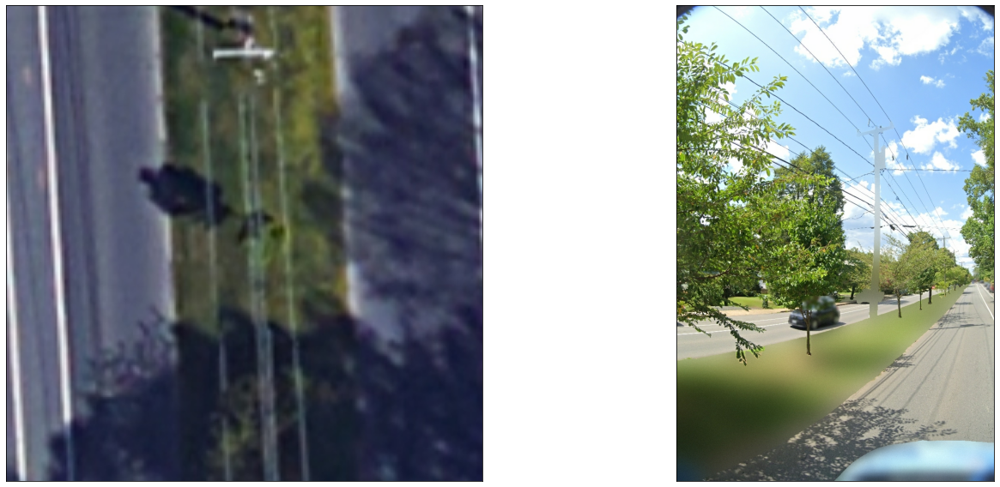

--------------------------------------------------------------------
source_id: 9371364189093519205
38.02644348144531, -78.48981475830078: prunus (235)


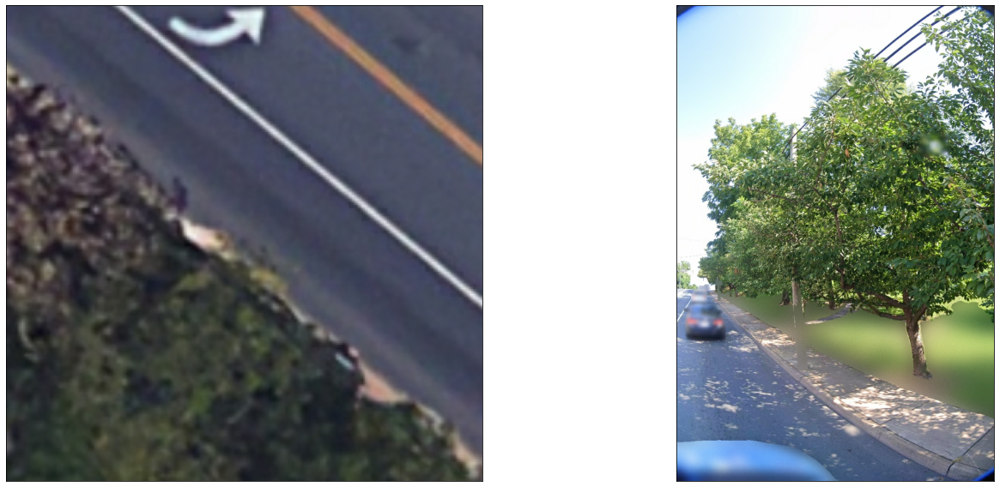

--------------------------------------------------------------------
source_id: 965514929351676004
38.02198028564453, -78.51483154296875: amelanchier (15)


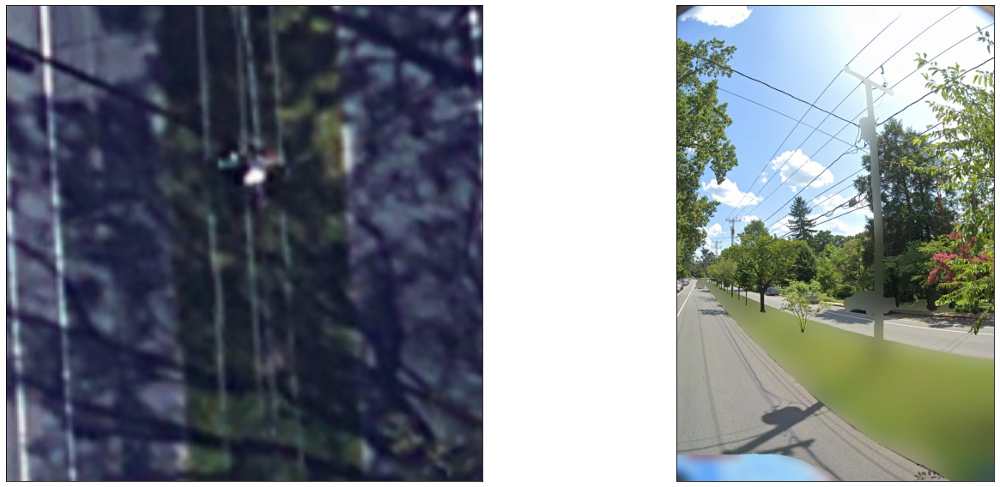

--------------------------------------------------------------------
source_id: 6313888876348782726
38.02267837524414, -78.51485443115234: cornus (83)


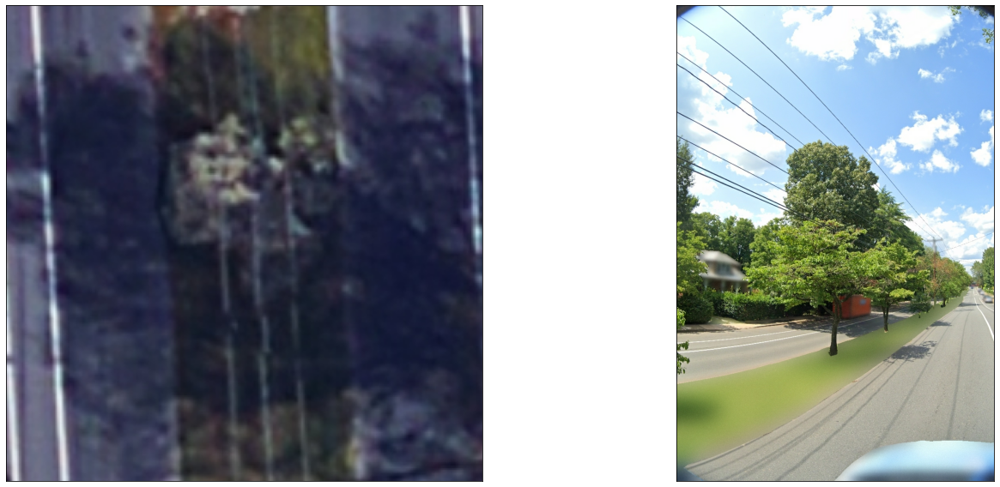

--------------------------------------------------------------------
source_id: 12905659136964755781
38.024227142333984, -78.47673034667969: amelanchier (15)


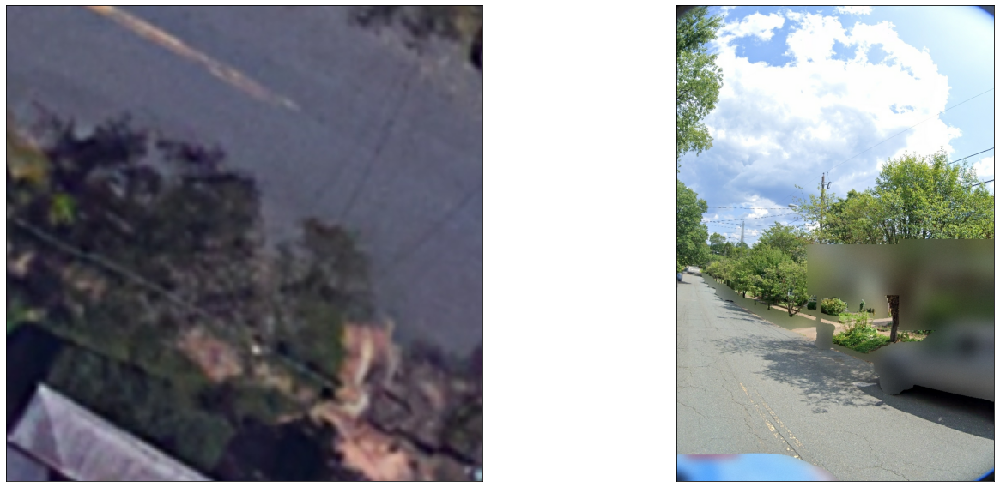

--------------------------------------------------------------------
source_id: 13278425906136366075
38.02391815185547, -78.47607421875: amelanchier (15)


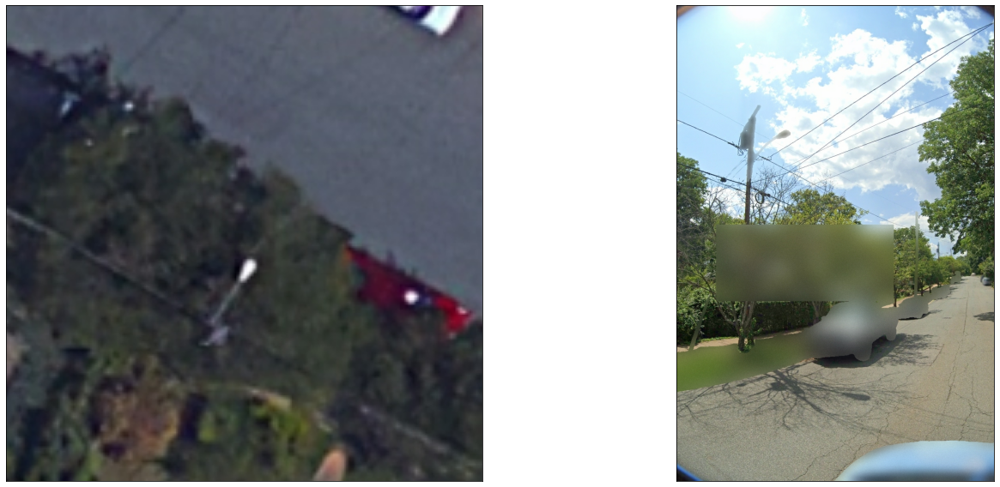

--------------------------------------------------------------------
source_id: 12873114726438670390
38.0103645324707, -78.50565338134766: malus (183)


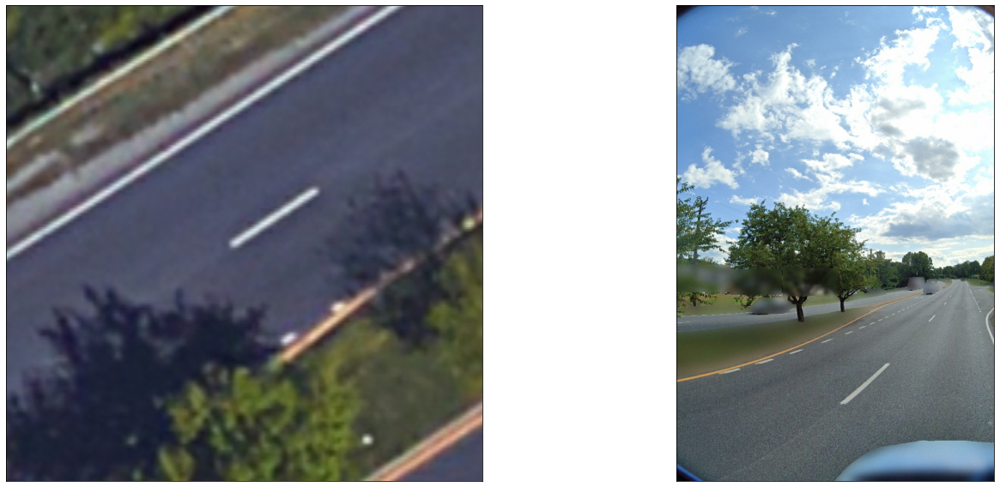

--------------------------------------------------------------------
source_id: 9334742015823178160
38.0228271484375, -78.47380065917969: zelkova (324)


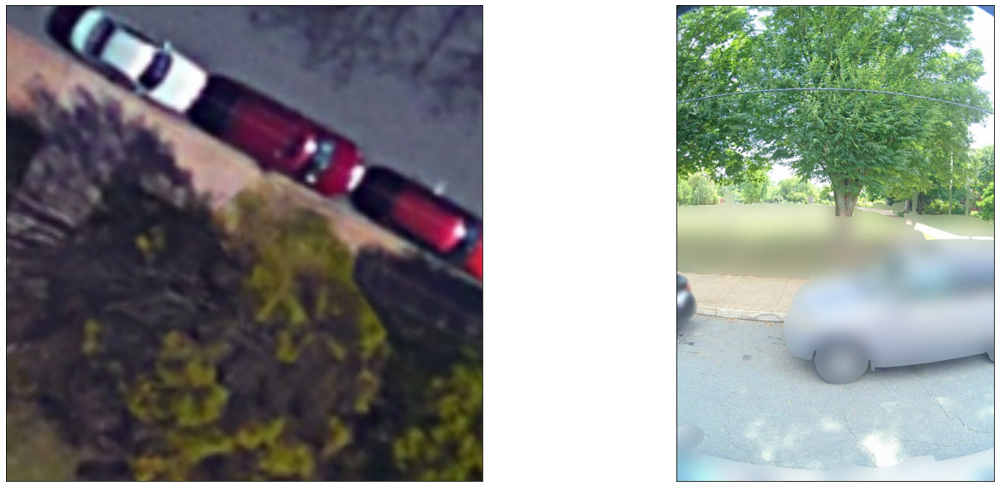

--------------------------------------------------------------------
source_id: 2799414296982185635
38.02791213989258, -78.48410034179688: ginkgo (131)


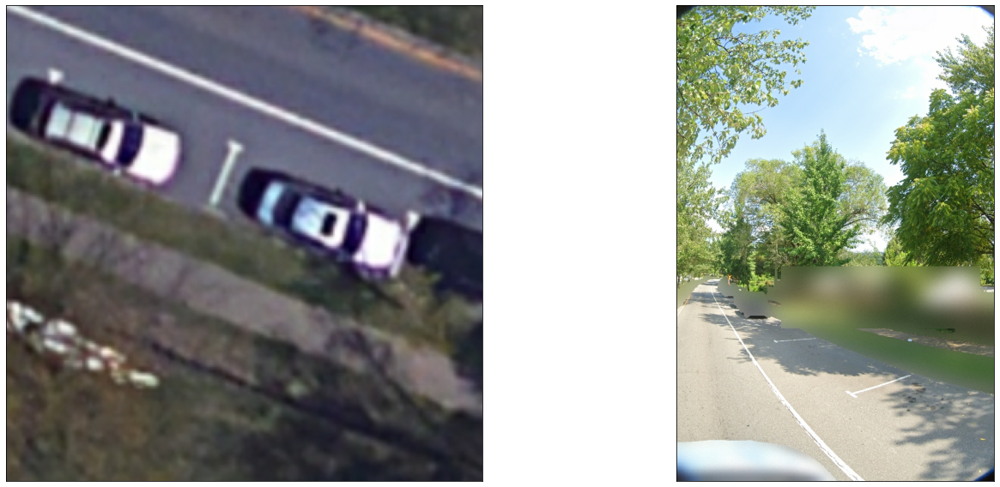

--------------------------------------------------------------------
source_id: 3169579593320785451
38.02296829223633, -78.51486206054688: acer (4)


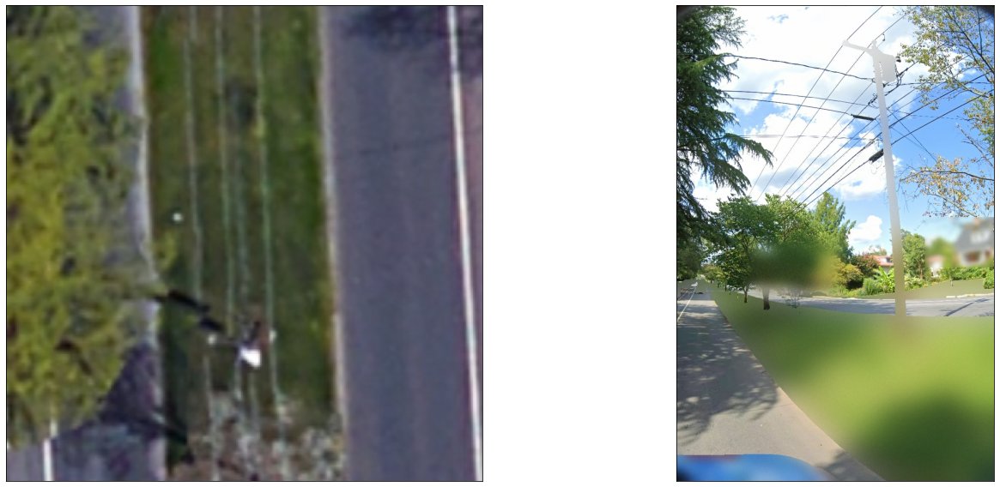

In [ ]:
# Number of trees to visualize.
num_trees = 25

# [TODO] Update the path below to match the local path to a data shard you want
# to visualize.
path = '/test-00000-of-00025'

raw_dataset = tf.data.TFRecordDataset(path)
for record in raw_dataset.take(num_trees):
  example = tf.io.parse_single_example(record, features)
  image_id = example['tree/id'].numpy().decode('utf-8')
  aerial_image = tf.image.decode_jpeg(example['aerial/encoded']).numpy()
  sv_image = tf.image.decode_jpeg(example['streetlevel/encoded']).numpy()
  lat = example['tree/latitude'].numpy()
  lng = example['tree/longitude'].numpy()
  label_id = example['tree/genus/label'].numpy()
  label_text = example['tree/genus/genus'].numpy().decode('utf-8')

  fig, axs = plt.subplots(1, 2)
  fig.set_size_inches(22, 8)

  print('--------------------------------------------------------------------')
  print('source_id: ' + image_id)
  print('{}, {}: {} ({})'.format(lat, lng, label_text, label_id))
  for i in range(2):
    axs[i].set_xticklabels([])
    axs[i].set_yticklabels([])
    axs[i].tick_params(axis='both', which='both',length=0)
  axs[0].imshow(aerial_image)
  axs[1].imshow(sv_image)
  plt.subplots_adjust(wspace=None, hspace=None)
  plt.tight_layout()

  plt.show()
